**Image-to-Image Translation with pix2pix cGAN**

In this project, we build and train a Conditional Generative Adversarial Network (cGAN) based on the **pix2pix** model, as proposed by Isola et al. (2017). The model translates input images to corresponding output images and is versatile across various tasks like image colorization, sketch-to-photo, and label-to-photo generation.

Here, we apply the pix2pix cGAN to the **CMP Facade Dataset** to generate building facades from label maps using a **U-Net generator** and **PatchGAN discriminator**.

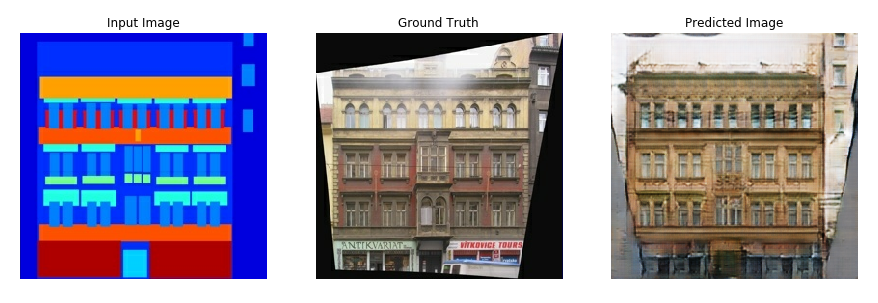

In [15]:
import tensorflow as tf
import os
import pathlib
import time
import datetime
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from IPython import display

In [3]:
dataset_name = "facades"

In [4]:
_URL = f'http://efrosgans.eecs.berkeley.edu/pix2pix/datasets/{dataset_name}.tar.gz'

path_to_zip = tf.keras.utils.get_file(
    fname=f"{dataset_name}.tar.gz",
    origin=_URL,
    extract=True)

path_to_zip  = pathlib.Path(path_to_zip)

PATH = path_to_zip.parent/dataset_name

30168306/30168306 ━━━━━━━━━━━━━━━━━━━━ 5s 0us/step


In [5]:
list(PATH.parent.iterdir())

[PosixPath('/root/.keras/datasets/facades.tar.gz'),
 PosixPath('/root/.keras/datasets/facades')]

Each original image is of size 256 x 512 containing two 256 x 256 images:

In [8]:
sample_image = tf.io.read_file(str(PATH / 'train/1.jpg'))
sample_image = tf.io.decode_jpeg(sample_image)
print(sample_image.shape)

(256, 512, 3)


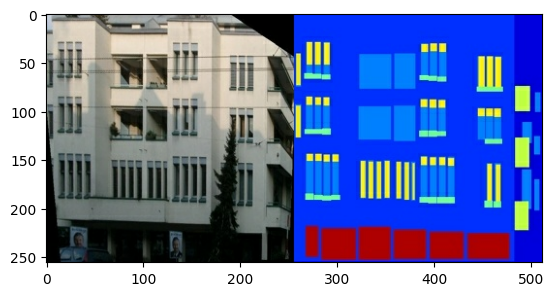

In [9]:
plt.figure()
plt.imshow(sample_image)

In [11]:
def load(image_file):
    """
    Load and preprocess images from the specified file.
    Args:
        image_file: Path to the image file.
    Returns:
        input_image: Tensor of the input image (architecture label).
        real_image: Tensor of the corresponding real building facade image.
    """
    # Read and decode the image file to a uint8 tensor
    image = tf.io.read_file(image_file)
    image = tf.io.decode_jpeg(image)

    # Split the image tensor into input (architecture label) and real (building facade) images
    width = tf.shape(image)[1] // 2
    input_image = image[:, width:, :]
    real_image = image[:, :width, :]

    # Convert both images to float32 tensors for further processing
    input_image = tf.cast(input_image, tf.float32)
    real_image = tf.cast(real_image, tf.float32)

    return input_image, real_image

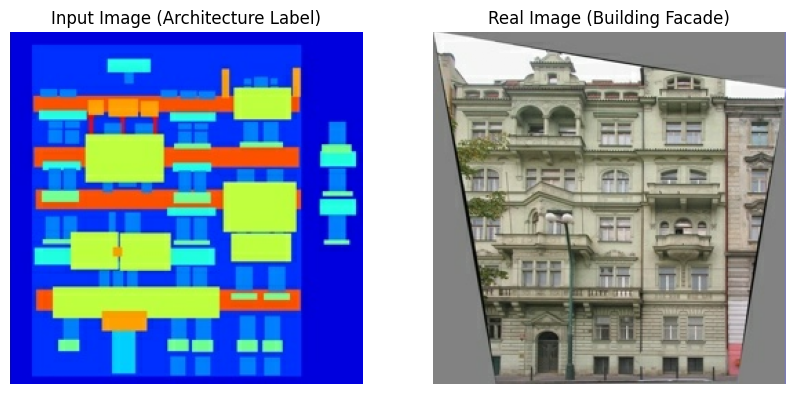

In [17]:
# Load the input and real images from the specified file
input_image, real_image = load(str(PATH / 'train/100.jpg'))
plt.figure(figsize=(10,10))

# Subplot for the input image (architecture label)
plt.subplot(1, 2, 1)  # 1 row, 2 columns, 1st subplot
plt.title("Input Image (Architecture Label)")
plt.imshow(input_image / 255.0)  # Normalize to [0, 1] for visualization
plt.axis('off')  # Turn off axis labels

# Subplot for the real image (building facade)
plt.subplot(1, 2, 2)  # 1 row, 2 columns, 2nd subplot
plt.title("Real Image (Building Facade)")
plt.imshow(real_image / 255.0)  # Normalize to [0, 1] for visualization
plt.axis('off')  # Turn off axis labels

plt.show()

**Image Preprocessing for pix2pix**
: As described in the pix2pix paper, we need to preprocess the training set by applying random jittering and mirroring. This involves the following steps:
1. **Resize Images**: Each 256 x 256 image will be resized to a larger dimension of 286 x 286.
2. **Random Cropping**: After resizing, the image will be randomly cropped back to the original size of 256 x 256.
3. **Random Mirroring**: Images will be randomly flipped horizontally (left to right) to enhance the diversity of the training set.
4. **Normalization**: Finally, the images will be normalized to the range of [-1, 1] for better performance during training.
The following functions will be defined to implement these preprocessing steps:

In [16]:
# The facade training set consist of 400 images
BUFFER_SIZE = 400
# The batch size of 1 produced better results for the U-Net in the original pix2pix experiment
BATCH_SIZE = 1
# Each image is 256x256 in size
IMG_WIDTH = 256
IMG_HEIGHT = 256

In [18]:
def resize(input_image, real_image, height, width):
  input_image = tf.image.resize(input_image, [height, width],
                                method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
  real_image = tf.image.resize(real_image, [height, width],
                               method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)

  return input_image, real_image

In [19]:
def random_crop(input_image, real_image):
  stacked_image = tf.stack([input_image, real_image], axis=0)
  cropped_image = tf.image.random_crop(
      stacked_image, size=[2, IMG_HEIGHT, IMG_WIDTH, 3])

  return cropped_image[0], cropped_image[1]

In [20]:
# Normalizing the images to [-1, 1]
def normalize(input_image, real_image):
  input_image = (input_image / 127.5) - 1
  real_image = (real_image / 127.5) - 1

  return input_image, real_image

In [21]:
@tf.function()
def random_jitter(input_image, real_image):
  # Resizing to 286x286
  input_image, real_image = resize(input_image, real_image, 286, 286)

  # Random cropping back to 256x256
  input_image, real_image = random_crop(input_image, real_image)

  if tf.random.uniform(()) > 0.5:
    # Random mirroring
    input_image = tf.image.flip_left_right(input_image)
    real_image = tf.image.flip_left_right(real_image)

  return input_image, real_image

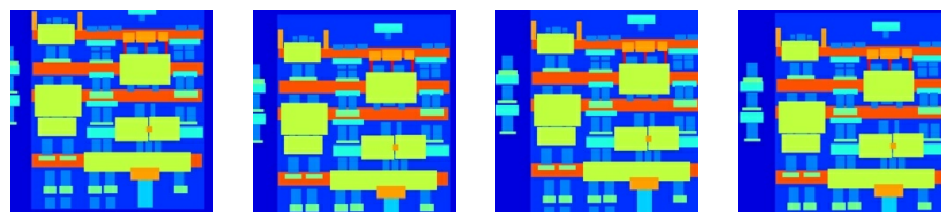

In [27]:
plt.figure(figsize=(12, 3))
for i in range(4):
  rj_inp, rj_re = random_jitter(input_image, real_image)
  plt.subplot(1, 4, i + 1)
  plt.imshow(rj_inp / 255.0)
  plt.axis('off')
plt.show()

In [28]:
def load_image_train(image_file):
  input_image, real_image = load(image_file)
  input_image, real_image = random_jitter(input_image, real_image)
  input_image, real_image = normalize(input_image, real_image)

  return input_image, real_image

In [29]:
def load_image_test(image_file):
  input_image, real_image = load(image_file)
  input_image, real_image = resize(input_image, real_image,
                                   IMG_HEIGHT, IMG_WIDTH)
  input_image, real_image = normalize(input_image, real_image)

  return input_image, real_image

**Input Pipeline with `tf.data`**

We will use the `tf.data` API to create an efficient input pipeline for loading and preprocessing the dataset. This will streamline tasks like resizing, random cropping, and normalization, ensuring smooth data feeding during model training.

In [30]:
train_dataset = tf.data.Dataset.list_files(str(PATH / 'train/*.jpg'))
train_dataset = train_dataset.map(load_image_train,
                                  num_parallel_calls=tf.data.AUTOTUNE)
train_dataset = train_dataset.shuffle(BUFFER_SIZE)
train_dataset = train_dataset.batch(BATCH_SIZE)

In [31]:
try:
  test_dataset = tf.data.Dataset.list_files(str(PATH / 'test/*.jpg'))
except tf.errors.InvalidArgumentError:
  test_dataset = tf.data.Dataset.list_files(str(PATH / 'val/*.jpg'))
test_dataset = test_dataset.map(load_image_test)
test_dataset = test_dataset.batch(BATCH_SIZE)

## Build the Generator

The generator in our pix2pix cGAN is based on a modified U-Net architecture, comprising an encoder and decoder.

- **Encoder (Downsampler)**: Each block includes Convolution, Batch Normalization, and Leaky ReLU.
- **Decoder (Upsampler)**: Each block features Transposed Convolution, Batch Normalization, Dropout (for the first three blocks), and ReLU.

Skip connections are incorporated between the encoder and decoder, enhancing information flow.


In [32]:
OUTPUT_CHANNELS = 3

In [33]:
def downsample(filters, size, apply_batchnorm=True):
  initializer = tf.random_normal_initializer(0., 0.02)

  result = tf.keras.Sequential()
  result.add(
      tf.keras.layers.Conv2D(filters, size, strides=2, padding='same',
                             kernel_initializer=initializer, use_bias=False))

  if apply_batchnorm:
    result.add(tf.keras.layers.BatchNormalization())

  result.add(tf.keras.layers.LeakyReLU())

  return result

In [35]:
down_model = downsample(3, 4)
down_result = down_model(tf.expand_dims(input_image, 0))
print (down_result.shape)

(1, 128, 128, 3)


Define the upsampler (decoder):

In [36]:
def upsample(filters, size, apply_dropout=False):
  initializer = tf.random_normal_initializer(0., 0.02)

  result = tf.keras.Sequential()
  result.add(
    tf.keras.layers.Conv2DTranspose(filters, size, strides=2,
                                    padding='same',
                                    kernel_initializer=initializer,
                                    use_bias=False))

  result.add(tf.keras.layers.BatchNormalization())

  if apply_dropout:
      result.add(tf.keras.layers.Dropout(0.5))

  result.add(tf.keras.layers.ReLU())

  return result

In [37]:
up_model = upsample(3, 4)
up_result = up_model(down_result)
print (up_result.shape)

(1, 256, 256, 3)


Define the generator with the downsampler and the upsampler:

In [38]:
def Generator():
  inputs = tf.keras.layers.Input(shape=[256, 256, 3])

  down_stack = [
    downsample(64, 4, apply_batchnorm=False),  # (batch_size, 128, 128, 64)
    downsample(128, 4),  # (batch_size, 64, 64, 128)
    downsample(256, 4),  # (batch_size, 32, 32, 256)
    downsample(512, 4),  # (batch_size, 16, 16, 512)
    downsample(512, 4),  # (batch_size, 8, 8, 512)
    downsample(512, 4),  # (batch_size, 4, 4, 512)
    downsample(512, 4),  # (batch_size, 2, 2, 512)
    downsample(512, 4),  # (batch_size, 1, 1, 512)
  ]

  up_stack = [
    upsample(512, 4, apply_dropout=True),  # (batch_size, 2, 2, 1024)
    upsample(512, 4, apply_dropout=True),  # (batch_size, 4, 4, 1024)
    upsample(512, 4, apply_dropout=True),  # (batch_size, 8, 8, 1024)
    upsample(512, 4),  # (batch_size, 16, 16, 1024)
    upsample(256, 4),  # (batch_size, 32, 32, 512)
    upsample(128, 4),  # (batch_size, 64, 64, 256)
    upsample(64, 4),  # (batch_size, 128, 128, 128)
  ]

  initializer = tf.random_normal_initializer(0., 0.02)
  last = tf.keras.layers.Conv2DTranspose(OUTPUT_CHANNELS, 4,
                                         strides=2,
                                         padding='same',
                                         kernel_initializer=initializer,
                                         activation='tanh')  # (batch_size, 256, 256, 3)

  x = inputs

  # Downsampling through the model
  skips = []
  for down in down_stack:
    x = down(x)
    skips.append(x)

  skips = reversed(skips[:-1])

  # Upsampling and establishing the skip connections
  for up, skip in zip(up_stack, skips):
    x = up(x)
    x = tf.keras.layers.Concatenate()([x, skip])

  x = last(x)

  return tf.keras.Model(inputs=inputs, outputs=x)

Visualizing the generator model architecture

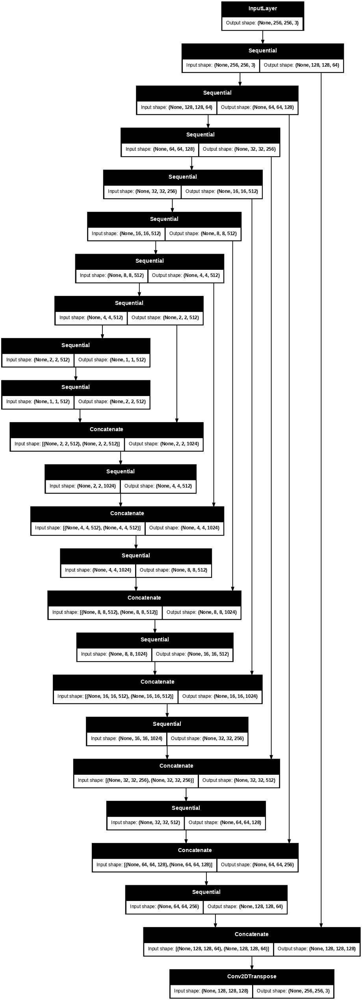

In [39]:
generator = Generator()
tf.keras.utils.plot_model(generator, show_shapes=True, dpi=64)

Test the generator:

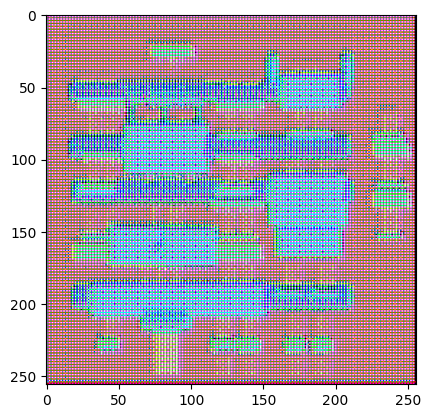

In [40]:
gen_output = generator(input_image[tf.newaxis, ...], training=False)
plt.imshow(gen_output[0, ...])

**Define the Generator Loss**

In pix2pix cGANs, the generator loss comprises two components:
1. **Adversarial Loss**: A sigmoid cross-entropy loss comparing generated images against an array of ones, ensuring that generated outputs are realistic.  
2. **L1 Loss**: A mean absolute error (MAE) between the generated image and the target image, promoting structural similarity.

The total generator loss is calculated as:

total\_generator\_loss = gan\_loss + lambda\*l1\_loss

where (lambda = 100\), a value determined by the authors to effectively balance the two loss components.



In [41]:
LAMBDA = 100

In [42]:
loss_object = tf.keras.losses.BinaryCrossentropy(from_logits=True)

In [43]:
def generator_loss(disc_generated_output, gen_output, target):
  gan_loss = loss_object(tf.ones_like(disc_generated_output), disc_generated_output)

  # Mean absolute error
  l1_loss = tf.reduce_mean(tf.abs(target - gen_output))

  total_gen_loss = gan_loss + (LAMBDA * l1_loss)

  return total_gen_loss, gan_loss, l1_loss

The training procedure for the generator is as follows:

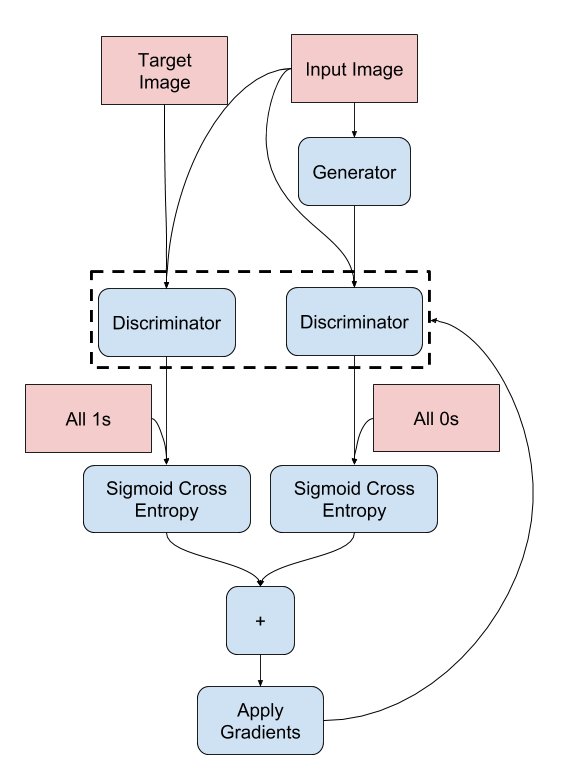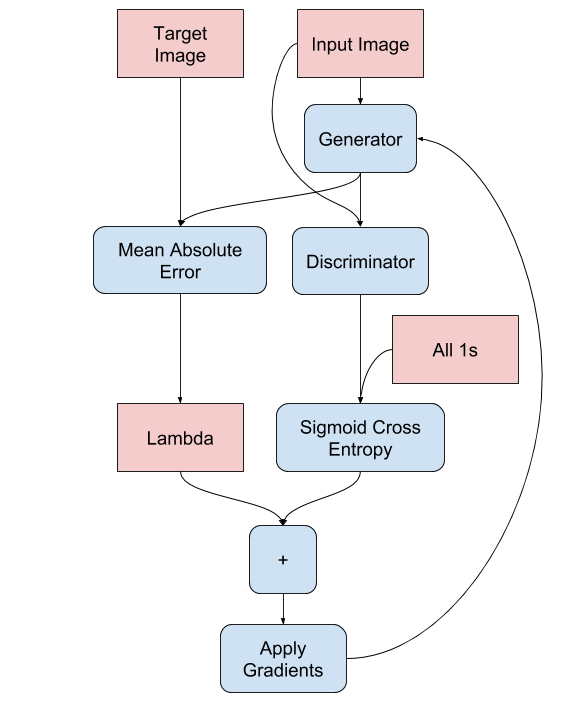

**Build the Discriminator**                                  
The discriminator in the pix2pix cGAN is a convolutional PatchGAN classifier that assesses whether each image patch is real or fake, as outlined in the pix2pix paper.                           
**Architecture:** Each block consists of Convolution -> Batch Normalization -> Leaky ReLU.                                  
**Output Shape:** The output shape is
(batch_size,30,30,1) with each
30×30patch classifying a 70×70 area of the input image.                  
**Inputs:**The discriminator takes two inputs:The real input image and the target image.                  
The real input image and the generated image from the generator.
To concatenate these inputs, use tf.concat([input_img, target_img], axis=-1).                                                   
Let's define the discriminator:

In [44]:
def Discriminator():
  initializer = tf.random_normal_initializer(0., 0.02)

  inp = tf.keras.layers.Input(shape=[256, 256, 3], name='input_image')
  tar = tf.keras.layers.Input(shape=[256, 256, 3], name='target_image')

  x = tf.keras.layers.concatenate([inp, tar])  # (batch_size, 256, 256, channels*2)

  down1 = downsample(64, 4, False)(x)  # (batch_size, 128, 128, 64)
  down2 = downsample(128, 4)(down1)  # (batch_size, 64, 64, 128)
  down3 = downsample(256, 4)(down2)  # (batch_size, 32, 32, 256)

  zero_pad1 = tf.keras.layers.ZeroPadding2D()(down3)  # (batch_size, 34, 34, 256)
  conv = tf.keras.layers.Conv2D(512, 4, strides=1,
                                kernel_initializer=initializer,
                                use_bias=False)(zero_pad1)  # (batch_size, 31, 31, 512)

  batchnorm1 = tf.keras.layers.BatchNormalization()(conv)

  leaky_relu = tf.keras.layers.LeakyReLU()(batchnorm1)

  zero_pad2 = tf.keras.layers.ZeroPadding2D()(leaky_relu)  # (batch_size, 33, 33, 512)

  last = tf.keras.layers.Conv2D(1, 4, strides=1,
                                kernel_initializer=initializer)(zero_pad2)  # (batch_size, 30, 30, 1)

  return tf.keras.Model(inputs=[inp, tar], outputs=last)

Visualize the discriminator model architecture:

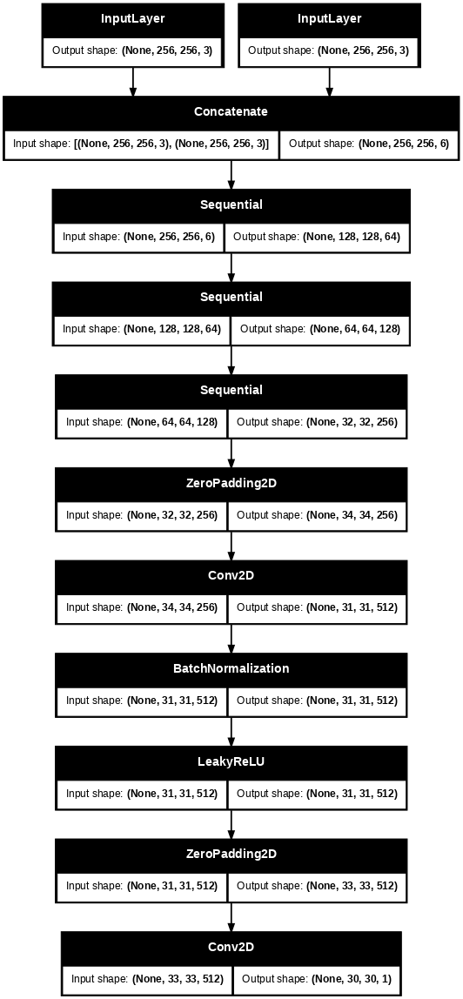

In [47]:
discriminator = Discriminator()
tf.keras.utils.plot_model(discriminator, show_shapes=True, dpi=64)

Test the discriminator:

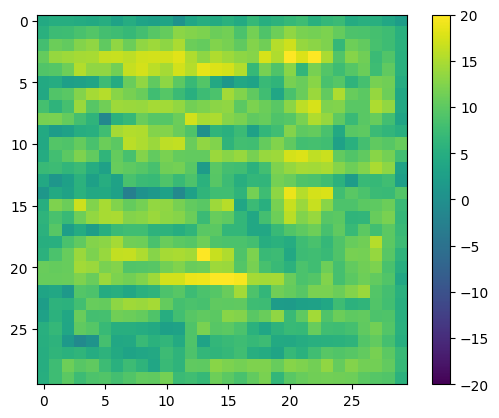

In [49]:
disc_out = discriminator([input_image[tf.newaxis, ...], gen_output], training=False)
plt.imshow(disc_out[0, ..., -1], vmin=-20, vmax=20, cmap='viridis')
plt.colorbar()

# Define the Discriminator Loss
The discriminator_loss function computes the loss for the discriminator using two inputs: real and generated images.                             
**real_loss:** Sigmoid cross-entropy loss between real images and an array of ones.                                                                 
**generated_loss:** Sigmoid cross-entropy loss between generated images and an array of zeros.                                              
**total_loss:** Sum of real_loss and generated_loss.

In [50]:
def discriminator_loss(disc_real_output, disc_generated_output):
  real_loss = loss_object(tf.ones_like(disc_real_output), disc_real_output)

  generated_loss = loss_object(tf.zeros_like(disc_generated_output), disc_generated_output)

  total_disc_loss = real_loss + generated_loss

  return total_disc_loss

The training procedure for the discriminator is shown below.

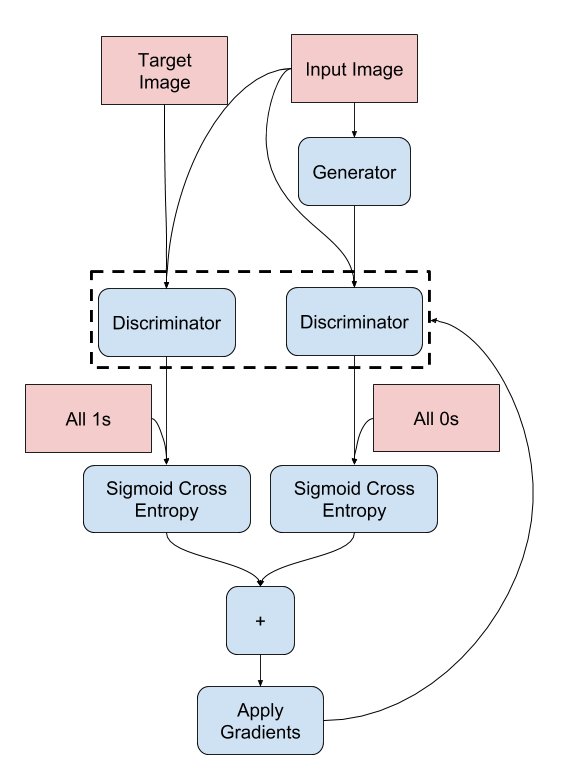

## Now,Define the optimizers and a checkpoint-saver

In [51]:
generator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

In [52]:
checkpoint_dir = './training_checkpoints'
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=generator,
                                 discriminator=discriminator)

In [53]:
def generate_images(model, test_input, tar):
  prediction = model(test_input, training=True)
  plt.figure(figsize=(15, 15))

  display_list = [test_input[0], tar[0], prediction[0]]
  title = ['Input Image', 'Ground Truth', 'Predicted Image']

  for i in range(3):
    plt.subplot(1, 3, i+1)
    plt.title(title[i])
    # Getting the pixel values in the [0, 1] range to plot.
    plt.imshow(display_list[i] * 0.5 + 0.5)
    plt.axis('off')
  plt.show()

Test the function:

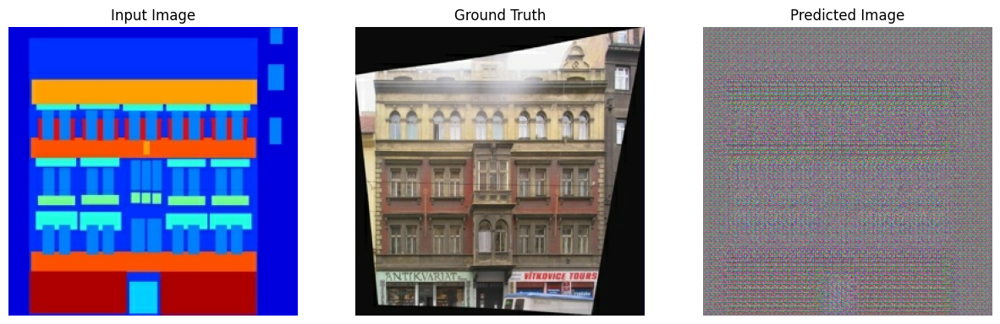

In [54]:
for example_input, example_target in test_dataset.take(1):
  generate_images(generator, example_input, example_target)

# Training
Generate an output for each input example.                                
The discriminator receives two inputs:                    
*1.input_image and generated_image                          
2.input_image and target_image*                                        
Calculate the losses for both the generator and the discriminator.         
Compute the gradients of the losses with respect to the generator and discriminator variables, and apply them using the optimizer.                  
Log the losses to TensorBoard for monitoring.



In [55]:
log_dir="logs/"

summary_writer = tf.summary.create_file_writer(
  log_dir + "fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))

In [56]:
@tf.function
def train_step(input_image, target, step):
  with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
    gen_output = generator(input_image, training=True)

    disc_real_output = discriminator([input_image, target], training=True)
    disc_generated_output = discriminator([input_image, gen_output], training=True)

    gen_total_loss, gen_gan_loss, gen_l1_loss = generator_loss(disc_generated_output, gen_output, target)
    disc_loss = discriminator_loss(disc_real_output, disc_generated_output)

  generator_gradients = gen_tape.gradient(gen_total_loss,
                                          generator.trainable_variables)
  discriminator_gradients = disc_tape.gradient(disc_loss,
                                               discriminator.trainable_variables)

  generator_optimizer.apply_gradients(zip(generator_gradients,
                                          generator.trainable_variables))
  discriminator_optimizer.apply_gradients(zip(discriminator_gradients,
                                              discriminator.trainable_variables))

  with summary_writer.as_default():
    tf.summary.scalar('gen_total_loss', gen_total_loss, step=step//1000)
    tf.summary.scalar('gen_gan_loss', gen_gan_loss, step=step//1000)
    tf.summary.scalar('gen_l1_loss', gen_l1_loss, step=step//1000)
    tf.summary.scalar('disc_loss', disc_loss, step=step//1000)

# Training Loop
*   Iterate through the specified number of steps instead of epochs to accommodate varying dataset sizes.
*   Print a dot (.) every 10 steps to indicate progress.
*   Every 1,000 steps, clear the display and call generate_images to visualize progress.   
*   Every 5,000 steps, save a checkpoint of the model.





In [57]:
def fit(train_ds, test_ds, steps):
  example_input, example_target = next(iter(test_ds.take(1)))
  start = time.time()

  for step, (input_image, target) in train_ds.repeat().take(steps).enumerate():
    if (step) % 1000 == 0:
      display.clear_output(wait=True)

      if step != 0:
        print(f'Time taken for 1000 steps: {time.time()-start:.2f} sec\n')

      start = time.time()

      generate_images(generator, example_input, example_target)
      print(f"Step: {step//1000}k")

    train_step(input_image, target, step)

    # Training step
    if (step+1) % 10 == 0:
      print('.', end='', flush=True)


    # Save (checkpoint) the model every 5k steps
    if (step + 1) % 5000 == 0:
      checkpoint.save(file_prefix=checkpoint_prefix)

Finally, run the training loop:

In [62]:
%load_ext tensorboard
%tensorboard --logdir logs/fit

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

Time taken for 1000 steps: 115.13 sec



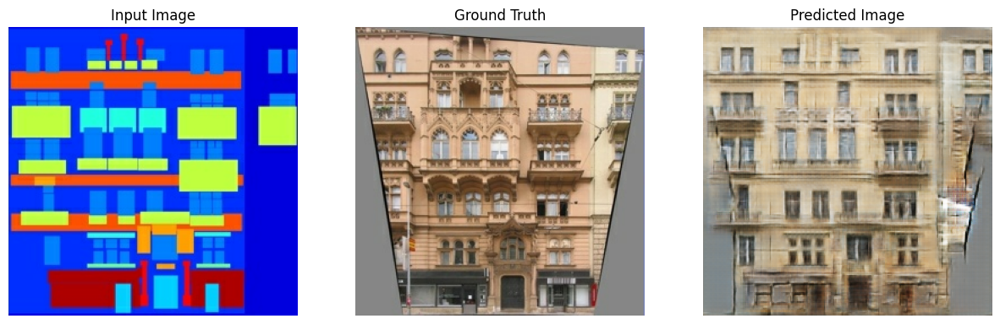

Step: 39k
....................................................................................................

In [63]:
fit(train_dataset, test_dataset, steps=40000)

In [64]:
tensorboard dev upload --logdir {log_dir}

Launching TensorBoard...

ERROR: Failed to launch TensorBoard (exited with 1).
Contents of stderr:
2024-09-11 18:32:10.536644: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-09-11 18:32:10.561397: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-09-11 18:32:10.570746: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-09-11 18:32:11.814946: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
ERROR: The `tensorboard dev` command is no longer available.

TensorBoard.dev has been shut down. For further information,
see the FAQ at <https://tensorboard.dev/>.

**Interpreting GAN Training Logs**                             
Monitor both gen_gan_loss and disc_loss. Neither model should dominate—if one loss is too low, it's a sign that training is imbalanced.               
Use 0.69 (log(2)) as a reference point. For the disc_loss, values below 0.69 mean it's performing better than random. For the gen_gan_loss, values below 0.69 indicate the generator is successfully fooling the discriminator.                                                     
The gen_l1_loss should steadily decrease as training progresses.

## Restore the latest checkpoint and test the network

In [66]:
ls {checkpoint_dir}

checkpoint                  ckpt-3.index                ckpt-6.index
ckpt-1.data-00000-of-00001  ckpt-4.data-00000-of-00001  ckpt-7.data-00000-of-00001
ckpt-1.index                ckpt-4.index                ckpt-7.index
ckpt-2.data-00000-of-00001  ckpt-5.data-00000-of-00001  ckpt-8.data-00000-of-00001
ckpt-2.index                ckpt-5.index                ckpt-8.index
ckpt-3.data-00000-of-00001  ckpt-6.data-00000-of-00001


In [67]:
# Restoring the latest checkpoint in checkpoint_dir
checkpoint.restore(tf.train.latest_checkpoint(checkpoint_dir))

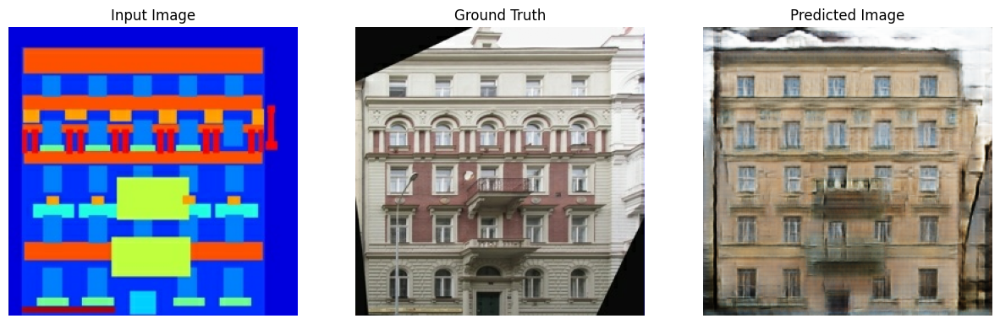

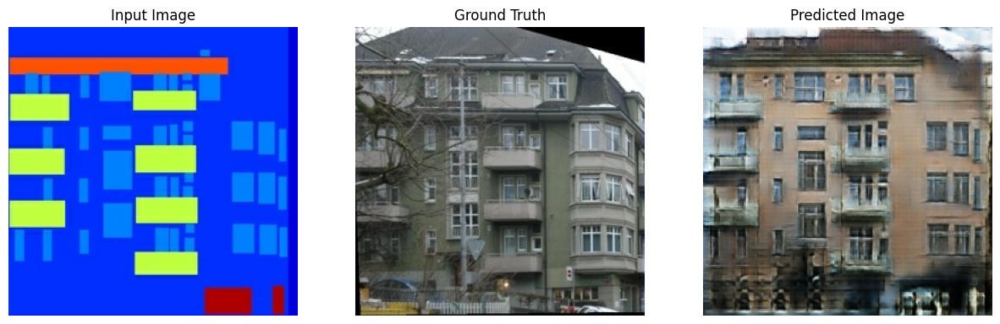

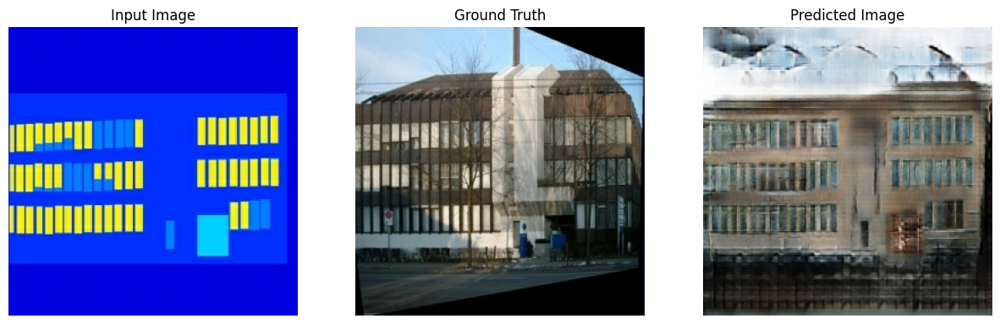

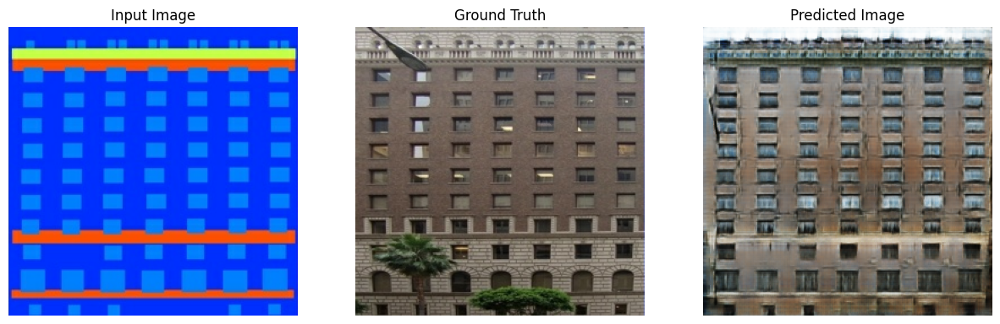

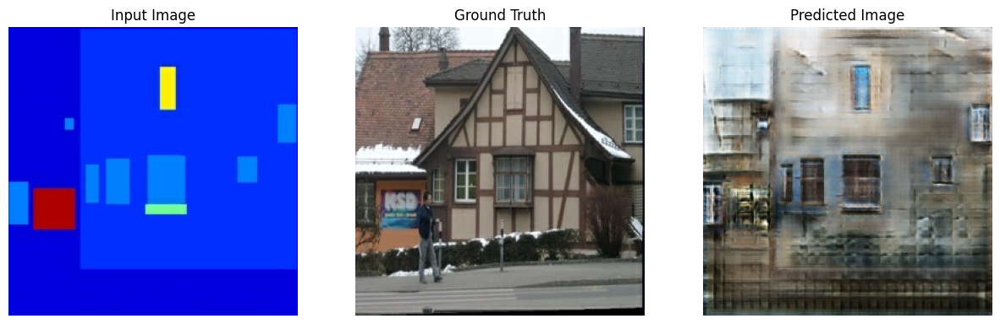

In [68]:
# Run the trained model on a few examples from the test set
for inp, tar in test_dataset.take(5):
  generate_images(generator, input_image, tar)